In [2]:
import datetime
import os
import random

from scripts.data_loader import *
from scripts.predict import *
from utils.metrics import normalize_mat
from scripts.postprocessing import *
from params import Param

import warnings
warnings.filterwarnings('ignore')

train_val_test_file = f'/home/yijun/notebooks/training_data/train_val_test_los_angeles_500m_fine_tune_1234.json'

geom_file = '/home/yijun/notebooks/training_data/los_angeles_500m_grid.csv'
device = torch.device("cuda:3" if torch.cuda.is_available() else 'cpu')  # the gpu device

""" load train, val, test locations """
f = open(train_val_test_file, 'r')
train_val_test = json.loads(f.read())
geom_df = pd.read_csv(geom_file)

kwargs = {
    'train_val_test': train_val_test,
    'device': device
}


In [71]:
def predict_main(dapm, param, **kwargs):

    dynamic_mat, label_mat = [], []

    data_dir = f'/home/yijun/notebooks/training_data/'
    data_obj = load_data(data_dir, param)
    train_loc, val_loc, test_loc = load_locations(kwargs['train_val_test'], param)

    data_obj.train_loc = train_loc
    data_obj.train_y = data_obj.gen_train_val_test_label(data_obj.label_mat, data_obj.train_loc)
    data_obj.val_loc = val_loc
    data_obj.val_y = data_obj.gen_train_val_test_label(data_obj.label_mat, data_obj.val_loc)
    data_obj.test_loc = test_loc
    data_obj.test_y = data_obj.gen_train_val_test_label(data_obj.label_mat, data_obj.test_loc)

    prediction = predict(dapm, data_obj, param, **kwargs)
    print('Max: {}; Min: {}'.format(np.max(prediction), np.min(prediction)))
    return prediction, data_obj
    
    
def out_weight(dapm, data_obj, param, **kwargs):
    feature_weight = extract_selected_features(dapm, data_obj.features_names, param.mask_thre)
    print(len(feature_weight), feature_weight)
    
def sp_viz(prediction, data_obj, param, **kwargs):
    spatial_viz(prediction, data_obj.mapping_mat, geom_df, basemap=True, title=str(param.year) + param.months[-1], **kwargs)    

def multi_sp_viz(multi_predictions, data_obj, param, r, c, **kwargs):
    
    n_rows, n_cols = data_obj.mapping_mat.shape
    mapping_mat_copy = data_obj.mapping_mat.reshape(1, n_rows, n_cols)
    
    df_list = []
    for prediction in multi_predictions:
        prediction_with_location = np.vstack([prediction, mapping_mat_copy]).reshape(2, -1)
        prediction_with_location = np.moveaxis(prediction_with_location, -1, 0)
        prediction_with_location = pd.DataFrame(prediction_with_location, columns=['prediction', 'gid'])
        prediction_with_location['gid'] = prediction_with_location['gid'].astype(int)
        out_df = prediction_with_location.merge(geom_df, on='gid')
        max_gid, min_gid = max(out_df['gid']), min(out_df['gid'])
        out_df.loc[out_df.gid == max_gid, 'prediction'] = 0.
        out_df.loc[out_df.gid == min_gid, 'prediction'] = 0.
        print(out_df)
        df_list.append(out_df)
        
    plot_multiple_surfaces('prediction', df_list, r, c, basemap=True, **kwargs)
    
    
def tp_viz(prediction, data_obj, param, **kwargs):
    plot_locations = random.sample(data_obj.test_loc, 5)
    temporal_viz(prediction, plot_locations, data_obj.test_y[param.seq_len:], 
                 data_obj.mapping_mat, title=str(param.year) + param.months[-1])

def write_csv(prediction, data_obj, param, **kwargs):
    write_prediction_csv(prediction, data_obj.label_mat[param.seq_len:], data_obj.mapping_mat, param, **kwargs)

def write_mongodb(prediction, data_obj, param, **kwargs):
    write_prediction_mongodb(prediction, data_obj.mapping_mat, param, **kwargs)


In [89]:
base_dir = f'data/los_angeles_500m_embedding_constraint_1234_tp1'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_sc___los_angeles_500m_2019___#01#___6_00001_1___1_01_5_0___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([1], 2019)
dapm = torch.load(kwargs['model_file'])    
prediction0, data_obj0 = predict_main(dapm, param, **kwargs)


dapm___sp_ae_sc_ec_from_stratch___los_angeles_500m_2019___#01#___6_00001_1___1_1_5___16_13 VAL RMSE = 7.2393, MAPE = 124.8833, R2 = 0.7624.
dapm___sp_ae_sc_ec_from_stratch___los_angeles_500m_2019___#01#___6_00001_1___1_1_5___16_13 TEST RMSE = 6.4482, MAPE = 96.6355, R2 = 0.8052.
Max: 115.707763671875; Min: 1.4066696166992188e-05


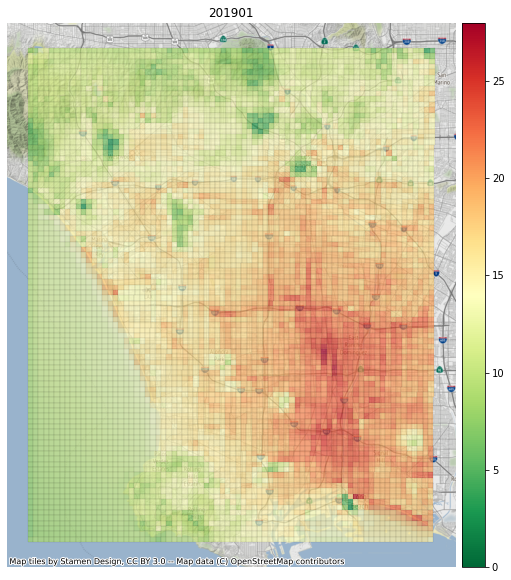

In [91]:
kwargs['v_min'] = 0
kwargs['v_max'] = None

mean_prediction = np.mean(prediction0, axis=0)
# out_weight(dapm, data_obj0, param, **kwargs)
sp_viz(mean_prediction, data_obj0, param, **kwargs)


In [10]:
base_dir = f'data/los_angeles_500m_separate_1234_tp1'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_sc___los_angeles_500m_2019___#01#___6_00001_1___2_01_5_0___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([1], 2019)
m = torch.load(kwargs['model_file'])    
prediction1, data_obj1 = predict_main(m, param, **kwargs)


dapm___sp_ae_sc___los_angeles_500m_2019___#01#___6_00001_1___2_01_5_0___16_13 VAL RMSE = 7.6513, MAPE = 147.9431, R2 = 0.7346.
dapm___sp_ae_sc___los_angeles_500m_2019___#01#___6_00001_1___2_01_5_0___16_13 TEST RMSE = 6.3636, MAPE = 95.2676, R2 = 0.8103.
Max: 111.06178283691406; Min: 1.3113021850585938e-05


36 [['wind_speed', 0.22036766], ['dayofweek', 0.21907975], ['dew_point', 0.19836257], ['pressure', 0.18190755], ['wind_direction', 0.13931997], ['lat', 0.13210489], ['temperature', 0.102276884], ['humidity', 0.094057925], ['wind_bearing_lr', 0.07181972], ['visibility', 0.06018918], ['wind_bearing', 0.059667546], ['roads_residential', 0.046333995], ['traffic_parking_bicycle', 0.04516079], ['roads_primary', 0.033704802], ['transport_bus_stop', 0.0326435], ['traffic_turning_circle', 0.03203507], ['traffic_stop', 0.02993798], ['roads_secondary', 0.02414665], ['landuse_a_residential', 0.023049979], ['railways_rail', 0.022835923], ['railways_light_rail', 0.020800294], ['roads_pedestrian', 0.019764608], ['roads_trunk', 0.01860456], ['traffic_fuel', 0.018386696], ['waterways_river', 0.017958201], ['landuse_a_retail', 0.016651472], ['waterways_drain', 0.016621513], ['landuse_a_recreation_ground', 0.016605707], ['traffic_motorway_junction', 0.01610903], ['roads_steps', 0.016082045], ['landuse_a_

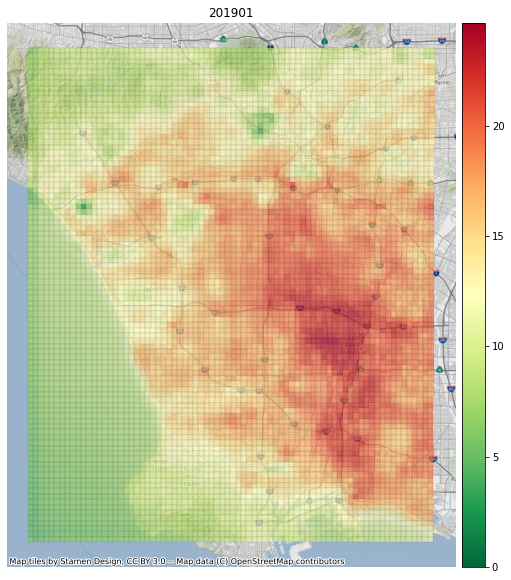

In [11]:
kwargs['v_min'] = 0
kwargs['v_max'] = None

mean_prediction = np.mean(prediction1, axis=0)
out_weight(m, data_obj1, param, **kwargs)
sp_viz(mean_prediction, data_obj1, param, **kwargs)
# tp_viz(prediction1, data_obj1, param, **kwargs)


In [20]:
base_dir = f'data/los_angeles_500m_embedding_constraint_1234_tp1'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_sc_embedding_similar_binned_distribution_from_stratch___los_angeles_500m_2019___#02#___6_00001_1___1_001_1_001___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([2], 2019)
mm = torch.load(kwargs['model_file'])    
prediction2, data_obj2 = predict_main(mm, param, **kwargs)


dapm___sp_ae_sc_embedding_similar_binned_distribution_from_stratch___los_angeles_500m_2019___#02#___6_00001_1___1_001_1_001___16_13 VAL RMSE = 4.3563, MAPE = 83.2494, R2 = 0.8301.
dapm___sp_ae_sc_embedding_similar_binned_distribution_from_stratch___los_angeles_500m_2019___#02#___6_00001_1___1_001_1_001___16_13 TEST RMSE = 4.4162, MAPE = 134.9148, R2 = 0.7899.
Max: 52.96373748779297; Min: 5.424022674560547e-06


40 [['dayofyear', 0.19450647], ['dew_point', 0.17637935], ['wind_speed', 0.16719101], ['hourofday', 0.15801242], ['lat', 0.13823234], ['cloud_cover', 0.11658296], ['temperature', 0.116419554], ['wind_bearing', 0.09967286], ['lon', 0.07465283], ['pressure', 0.07272523], ['visibility', 0.06530758], ['wind_bearing_lr', 0.06381037], ['month', 0.03777135], ['traffic_parking_bicycle', 0.030116916], ['traffic_parking', 0.02820422], ['wind_direction', 0.02705576], ['roads_secondary', 0.026342317], ['roads_trunk', 0.022683142], ['waterways_river', 0.019365877], ['roads_tertiary', 0.019146929], ['traffic_motorway_junction', 0.018404936], ['roads_primary', 0.017239155], ['transport_bus_stop', 0.015247283], ['waterways_drain', 0.014769575], ['landuse_a_recreation_ground', 0.014393459], ['natural_a_beach', 0.012610949], ['railways_rail', 0.012534123], ['waterways_stream', 0.011739472], ['landuse_a_meadow', 0.011555198], ['traffic_dam', 0.011197051], ['traffic_slipway', 0.011100142], ['roads_residen

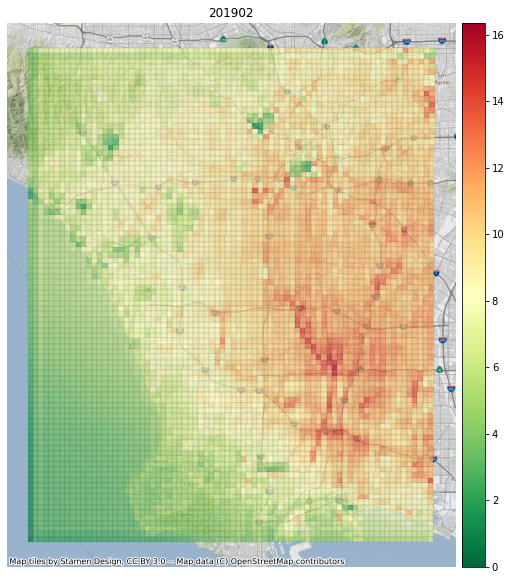

In [21]:
kwargs['v_min'] = 0
kwargs['v_max'] = None
t = 58

mean_prediction = np.mean(prediction2, axis=0)
out_weight(mm, data_obj2, param, **kwargs)
sp_viz(mean_prediction, data_obj2, param, **kwargs)

# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)


In [74]:
base_dir = f'data/los_angeles_500m_embedding_constraint_1234_tp1'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_sc_eac_similar_distribution_from_stratch___los_angeles_500m_2019___#02#___6_00001_1___1_001_5___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([2], 2019)
dapm = torch.load(kwargs['model_file'])    
prediction4, data_obj4 = predict_main(dapm, param, **kwargs)


dapm___sp_ae_sc_eac_similar_distribution_from_stratch___los_angeles_500m_2019___#02#___6_00001_1___1_001_5___16_13 VAL RMSE = 4.1903, MAPE = 87.3471, R2 = 0.8428.
dapm___sp_ae_sc_eac_similar_distribution_from_stratch___los_angeles_500m_2019___#02#___6_00001_1___1_001_5___16_13 TEST RMSE = 4.0862, MAPE = 124.3011, R2 = 0.8201.
Max: 54.395999908447266; Min: 4.410743713378906e-06


19 [['dew_point', 0.19517551], ['lat', 0.18864687], ['dayofyear', 0.14942469], ['wind_speed', 0.14405753], ['wind_bearing_lr', 0.12799306], ['temperature', 0.12636574], ['dayofweek', 0.11325154], ['lon', 0.11120607], ['cloud_cover', 0.10370964], ['hourofday', 0.081860125], ['wind_direction', 0.05614572], ['pressure', 0.05484465], ['traffic_motorway_junction', 0.034460295], ['landuse_a_residential', 0.029356737], ['roads_living_street', 0.024635898], ['roads_tertiary_link', 0.021112828], ['landuse_a_industrial', 0.0180927], ['transport_bus_station', 0.017501835], ['roads_steps', 0.0079846345]]


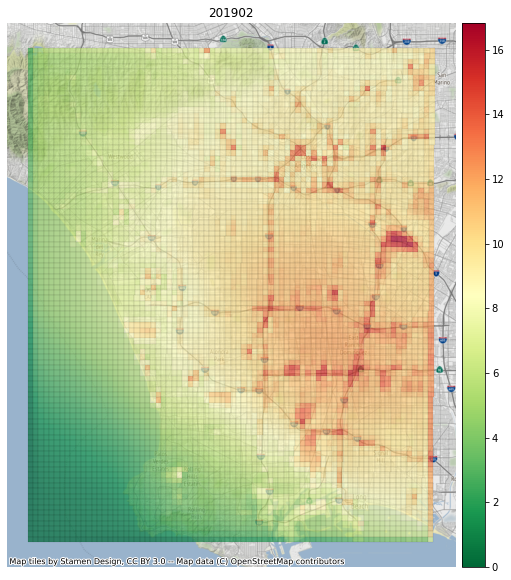

In [75]:
kwargs['v_min'] = 0
kwargs['v_max'] = None
t = 20

mean_prediction = np.mean(prediction4, axis=0)
out_weight(dapm, data_obj4, param, **kwargs)
sp_viz(mean_prediction, data_obj4, param, **kwargs)
# tp_viz(prediction4, data_obj4, param, **kwargs)
# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)


In [7]:
base_dir = f'data/los_angeles_500m_embedding_constraint_1234_tp1'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_esc_embedding_similar_binned_distribution___los_angeles_500m_2019___#01#___6_00001_1___05_10_5_01___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([1], 2019)
m7 = torch.load(kwargs['model_file'])    
prediction7, data_obj7 = predict_main(m7, param, **kwargs)


dapm___sp_ae_esc_embedding_similar_binned_distribution___los_angeles_500m_2019___#01#___6_00001_1___05_10_5_01___16_13 VAL RMSE = 8.1046, MAPE = 188.3438, R2 = 0.7023.
dapm___sp_ae_esc_embedding_similar_binned_distribution___los_angeles_500m_2019___#01#___6_00001_1___05_10_5_01___16_13 TEST RMSE = 7.4850, MAPE = 108.9391, R2 = 0.7375.
Max: 113.82762908935547; Min: 2.002716064453125e-05


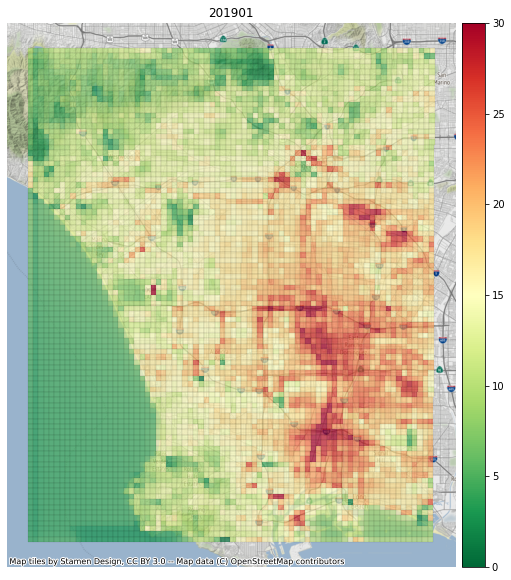

In [8]:
kwargs['v_min'] = 0
kwargs['v_max'] = 30
t = 10

mean_prediction = np.mean(prediction7, axis=0)
# out_weight(m6, data_obj6, param, **kwargs)
sp_viz(mean_prediction, data_obj7, param, **kwargs)
# tp_viz(prediction4, data_obj4, param, **kwargs)
# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)
# write_csv(prediction7, data_obj7, param, **kwargs)


In [83]:
base_dir = f'data/los_angeles_500m_embedding_constraint_1234_tp1'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_esc_embedding_similar_binned_distribution___los_angeles_500m_2019___#02#___6_00001_1___01_5_5_001___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([2], 2019)
m6 = torch.load(kwargs['model_file'])    
prediction6, data_obj6 = predict_main(m6, param, **kwargs)


dapm___sp_ae_esc_embedding_similar_binned_distribution___los_angeles_500m_2019___#02#___6_00001_1___01_5_5_001___16_13 VAL RMSE = 4.3675, MAPE = 82.6040, R2 = 0.8292.
dapm___sp_ae_esc_embedding_similar_binned_distribution___los_angeles_500m_2019___#02#___6_00001_1___01_5_5_001___16_13 TEST RMSE = 4.4905, MAPE = 130.3373, R2 = 0.7828.
Max: 56.31916046142578; Min: 2.9802322387695312e-06


In [214]:
np.where(data_obj6.mapping_mat==1191)
# np.where(data_obj6.mapping_mat==5681)
# prediction6[[i for i in range(j, n_t, 24)], 0, :, :].shape

(array([76]), array([50]))

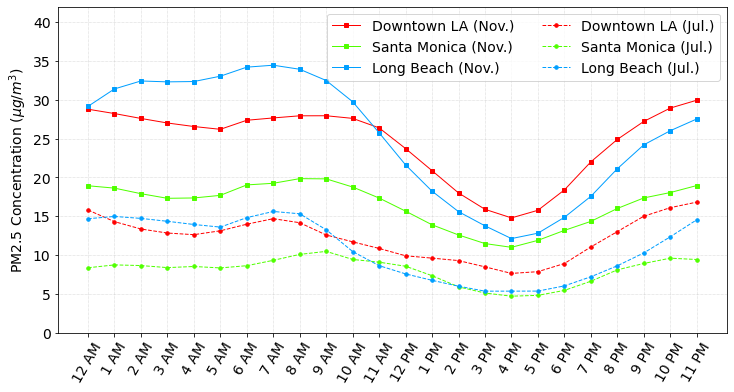

In [259]:
kwargs['v_min'] = 0
kwargs['v_max'] = 20
n_t = prediction9.shape[0]

dt_time_idx = []
for j in range(24):
    dt_time_idx.append(np.mean(prediction9[[i for i in range(j, n_t, 24)], 0, 17:37, 46:66] - 2))

sm_time_idx = []
for j in range(24):
    sm_time_idx.append(np.mean(prediction9[[i for i in range(j, n_t, 24)], 0, 25:35, 4:14] - 2))

lb_time_idx = []
for j in range(24):
    lb_time_idx.append(np.mean(prediction9[[i for i in range(j, n_t, 24)], 0, 76:86, 55:65] - 2))

n_t = prediction6.shape[0]

dt_time_idx6 = []
for j in range(24):
    dt_time_idx6.append(np.mean(prediction6[[i for i in range(j, n_t, 24)], 0, 17:37, 46:66] + 2))

sm_time_idx6 = []
for j in range(24):
    sm_time_idx6.append(np.mean(prediction6[[i for i in range(j, n_t, 24)], 0, 25:35, 4:14] + 2))

lb_time_idx6 = []
for j in range(24):
    lb_time_idx6.append(np.mean(prediction6[[i for i in range(j, n_t, 24)], 0, 76:86, 55:65] + 2))

    
def plot_multiple_time_series1(series_list, label_list, x_ticks, **kwargs):
    
    cmap = plt.cm.get_cmap("hsv", len(label_list) + 5)
    for i, _ in enumerate(series_list):
        plt.plot(x_ticks, series_list[i], marker=kwargs['marker'], markersize=3.5, linestyle=kwargs['linestyle'],
                 linewidth=1, color=cmap(i * 2), label=label_list[i])
    
    plt.ylabel('PM2.5 Concentration ($\mu g/m^3}$)', fontsize=14)
    plt.xticks(rotation=60, fontsize=14)
    plt.yticks(fontsize=14)
    plt.ylim(0, 42)

    """ some optional configuration """
    if kwargs.get('title') is not None:
        plt.title(kwargs['title'])
    plt.legend(prop={'size': 14}, loc=1, ncol=2)
    plt.grid(linestyle='dotted', linewidth=0.5)

plt.figure(figsize=(12, 6))

x_labels = ['12 AM'] + [f'{i} AM' for i in range(1, 12)] +  ['12 PM'] + [f'{i} PM' for i in range(1, 12)]
plot_multiple_time_series1([dt_time_idx, sm_time_idx, lb_time_idx], 
                           ['Downtown LA (Nov.)', 'Santa Monica (Nov.)', 'Long Beach (Nov.)'], x_labels, linestyle=None, marker='s')
plot_multiple_time_series1([dt_time_idx6, sm_time_idx6, lb_time_idx6], 
                           ['Downtown LA (Jul.)', 'Santa Monica (Jul.)', 'Long Beach (Jul.)'], x_labels, linestyle='dashed', marker='o')

# plt.plot(x_labels, ig_time_idx, marker='.', markersize=5.0, linewidth=1, color='purple', label='Average')
plt.show()


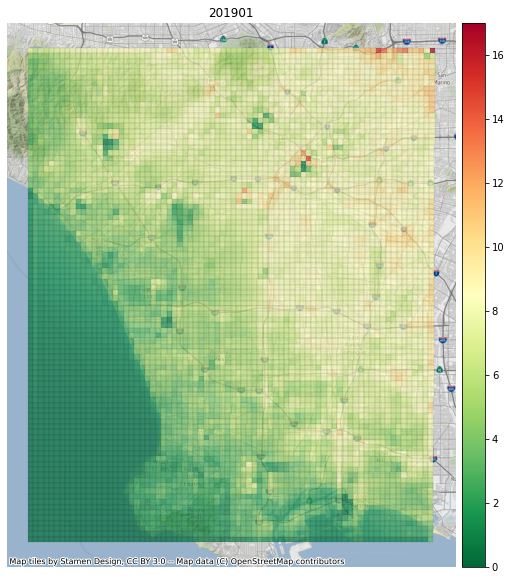

In [165]:
kwargs['v_min'] = 0
kwargs['v_max'] = 17
n_t = prediction6.shape[0]

morning_idx = []
for j in range(5, 12):
    morning_idx += [i for i in range(j, n_t, 24)]

night_idx = []
for j in range(21, 24):
    night_idx += [i for i in range(j, n_t, 24)]
for j in range(0, 5):
    night_idx += [i for i in range(j, n_t, 24)]

afternoon_idx = []
for j in range(12, 17):
    afternoon_idx += [i for i in range(j, n_t, 24)]

evening_idx = []
for j in range(17, 21):
    evening_idx += [i for i in range(j, n_t, 24)]

mean_prediction = np.mean(prediction6[evening_idx, ...], axis=0)
sp_viz(mean_prediction, data_obj6, param, **kwargs)


672
Testing locations: 4492


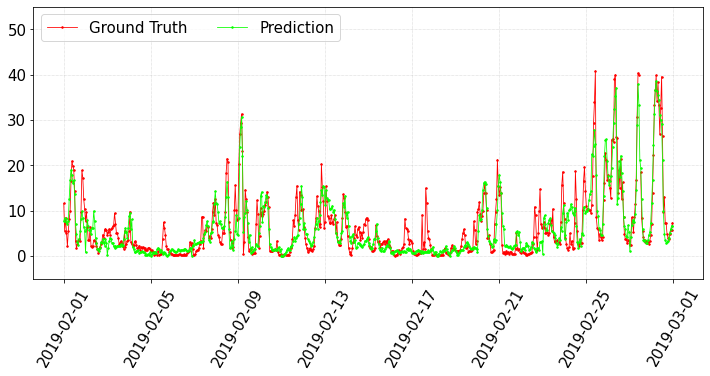

Testing locations: 5914


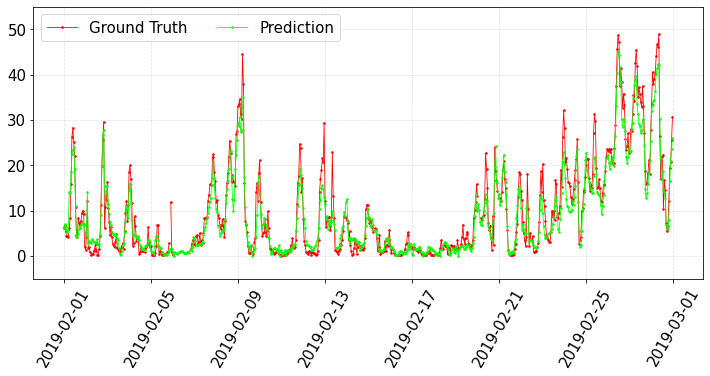

In [157]:
kwargs['v_min'] = 0
kwargs['v_max'] = 18
t = 10

# mean_prediction = np.mean(prediction6, axis=0)
# out_weight(m6, data_obj6, param, **kwargs)
# sp_viz(mean_prediction, data_obj6, param, **kwargs)
# tp_viz(prediction6, data_obj6, param, **kwargs)
# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)
# write_csv(prediction6, data_obj6, param, **kwargs)

# temporal_viz(prediction6, [4492, 5914], data_obj.test_y[param.seq_len:], 
#                  data_obj.mapping_mat, title=str(param.year) + param.months[-1])

ok_result_file = f'/home/yijun/notebooks/data_distribution_analysis/data/OK_results/los_angeles_500m_2019_02_prediction.csv'
ok_df = pd.read_csv(ok_result_file)

def plot_multiple_time_series1(series_list, label_list, x_ticks, **kwargs):
    
    cmap = plt.cm.get_cmap("hsv", len(label_list) + 5)
    plt.figure(figsize=(12, 5))
    for i, _ in enumerate(series_list):
        plt.plot(x_ticks, series_list[i], marker='.', markersize=3.0, linewidth=0.8, color=cmap(i * 2), label=label_list[i])
     
    plt.xticks(rotation=60, fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylim(-5, 55)

    """ some optional configuration """
    if kwargs.get('title') is not None:
        plt.title(kwargs['title'])
    plt.legend(prop={'size': 15}, loc=2, ncol=3)
    plt.grid(linestyle='dotted', linewidth=0.5)
    plt.show()

min_time = '2019-02'
max_time = '2019-03'
tz = pytz.timezone('America/Los_Angeles')
time_list = pd.date_range(start=min_time, end=max_time, closed='left', freq='1H')
print(len(time_list))
for loc in [4492, 5914]:
    ok_sub_df = ok_df[ok_df['gid'] == loc]
    ok_prediction = ok_sub_df['prediction']
    
    print('Testing locations: {}'.format(loc))
    loc_index_r, loc_index_c = np.where(data_obj6.mapping_mat == loc)
    series_list = [data_obj6.test_y[0 + param.seq_len:, 0, loc_index_r[0], loc_index_c[0]].reshape(-1), 
                   prediction6[:, 0, loc_index_r[0], loc_index_c[0]].reshape(-1)] 
                   
    label_list = ['Ground Truth', 'Prediction']
    x_ticks = time_list[:]
    plot_multiple_time_series1(series_list, label_list, x_ticks, **kwargs)
        

In [140]:
base_dir = f'data/los_angeles_500m_acc_1234_tp1_2'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_01___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([1], 2019)
m9 = torch.load(kwargs['model_file'])    
prediction9, data_obj9 = predict_main(m9, param, **kwargs)


FileNotFoundError: [Errno 2] No such file or directory: 'data/los_angeles_500m_acc_1234_tp1_2/models/dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_01___16_13.pkl'

49 [['dayofweek', 0.3202624], ['wind_speed', 0.292524], ['pressure', 0.2779806], ['wind_direction', 0.24360065], ['hourofday', 0.22839385], ['humidity', 0.20121425], ['dew_point', 0.18918534], ['lat', 0.13090777], ['lon', 0.12252414], ['wind_bearing', 0.12075564], ['visibility', 0.090772085], ['traffic_parking_bicycle', 0.08977487], ['roads_path', 0.08241081], ['roads_trunk', 0.071039155], ['roads_motorway_link', 0.052525476], ['landuse_a_scrub', 0.05183262], ['dayofyear', 0.049719237], ['natural_a_beach', 0.035483595], ['roads_tertiary', 0.03302707], ['landuse_a_recreation_ground', 0.0324791], ['transport_bus_stop', 0.030386725], ['railways_light_rail', 0.029906817], ['waterways_stream', 0.029236356], ['traffic_traffic_signals', 0.027961224], ['traffic_fuel', 0.026865419], ['waterways_drain', 0.025653007], ['traffic_dam', 0.025067762], ['traffic_turning_circle', 0.024569644], ['roads_tertiary_link', 0.023094041], ['landuse_a_retail', 0.022964219], ['roads_primary', 0.019979188], ['wat

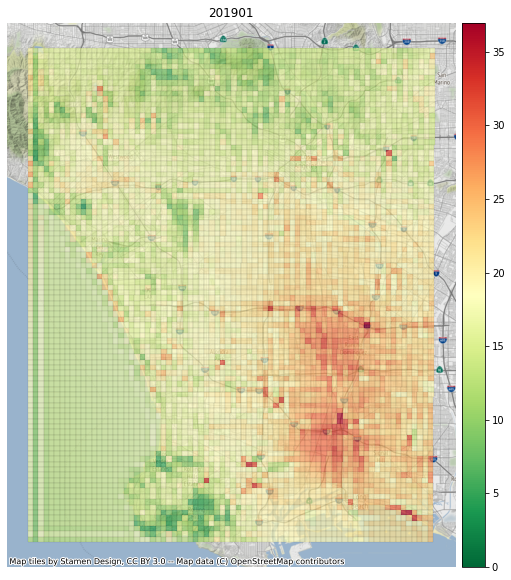

In [21]:
kwargs['v_min'] = 0
kwargs['v_max'] = None
t = 10

mean_prediction = np.mean(prediction9, axis=0)
out_weight(m9, data_obj9, param, **kwargs)
sp_viz(mean_prediction, data_obj9, param, **kwargs)
# tp_viz(prediction4, data_obj4, param, **kwargs)
# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)
# write_csv(prediction6, data_obj6, param, **kwargs)


In [37]:
base_dir = f'data/los_angeles_500m_acc_1234_tp1_2'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_001___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([1], 2019)
m9 = torch.load(kwargs['model_file'])    
prediction9, data_obj9 = predict_main(m9, param, **kwargs)


dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 8.0843, MAPE = 179.1022, R2 = 0.7038.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 6.9327, MAPE = 111.6855, R2 = 0.7748.
Max: 105.34081268310547; Min: 4.76837158203125e-06


22 [['dayofyear', 0.43311164], ['dayofweek', 0.39976144], ['dew_point', 0.19876377], ['wind_speed', 0.10540054], ['visibility', 0.0914598], ['temperature', 0.039953478], ['landuse_a_military', 0.013508746], ['cloud_cover', 0.005405103], ['wind_bearing', 0.0053198272], ['humidity', 0.0023671666], ['roads_steps', 0.0019758078], ['lat', 0.0018473602], ['roads_service', 0.0015821488], ['roads_pedestrian', 0.0013210251], ['landuse_a_retail', 0.0011981783], ['roads_tertiary', 0.0011902407], ['roads_living_street', 0.0010452133], ['roads_tertiary_link', 0.00097058027], ['pressure', 0.0009290756], ['landuse_a_residential', 0.00041962173], ['traffic_stop', 0.0002800612], ['waterways_stream', 0.00010970766]]


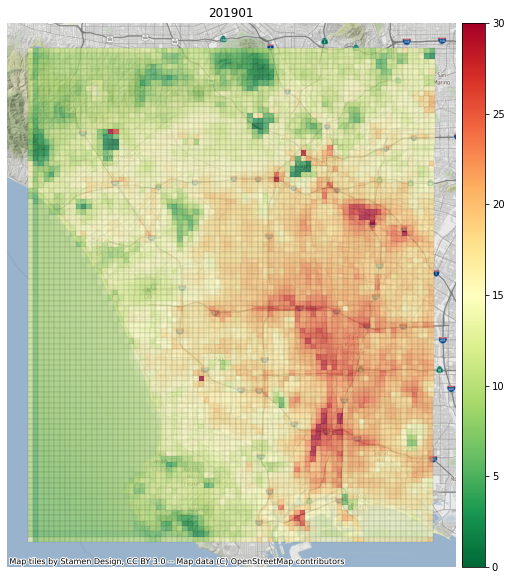

In [43]:
kwargs['v_min'] = 0
kwargs['v_max'] = 30
t = 10

mean_prediction = np.mean(prediction9, axis=0)
out_weight(m9, data_obj9, param, **kwargs)
sp_viz(mean_prediction, data_obj9, param, **kwargs)
# tp_viz(prediction4, data_obj4, param, **kwargs)
# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)
# write_csv(prediction9, data_obj9, param, **kwargs)


In [36]:
prediction9.shape

(738, 1, 92, 76)

In [47]:
base_dir = f'data/los_angeles_500m_acc_1234_tp1_2'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_esc_acc___los_angeles_500m_2018___#02#___6_00001_1___1_10_5_001___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([2], 2018)
m9 = torch.load(kwargs['model_file'])    
prediction9, data_obj9 = predict_main(m9, param, **kwargs)



dapm___sp_ae_esc_acc___los_angeles_500m_2018___#02#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 4.8566, MAPE = 55.6660, R2 = 0.8727.
dapm___sp_ae_esc_acc___los_angeles_500m_2018___#02#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 8.9561, MAPE = 125.4771, R2 = 0.5490.
Max: 64.05115509033203; Min: 4.6193599700927734e-06


26 [['dew_point', 0.3137378], ['wind_speed', 0.29382774], ['dayofyear', 0.26317346], ['visibility', 0.2615064], ['temperature', 0.20046987], ['hourofday', 0.1837246], ['dayofweek', 0.16805932], ['cloud_cover', 0.16446024], ['wind_bearing', 0.15753236], ['wind_direction', 0.13413513], ['wind_bearing_lr', 0.031186845], ['landuse_a_residential', 0.006035911], ['landuse_a_retail', 0.0032004977], ['traffic_stop', 0.0027372162], ['traffic_mini_roundabout', 0.0016497545], ['transport_railway_station', 0.0013595587], ['roads_motorway', 0.0010075432], ['pressure', 0.0008087706], ['roads_path', 0.0007300831], ['traffic_dam', 0.0006117593], ['landuse_a_industrial', 0.00044209388], ['traffic_parking', 0.00029191686], ['traffic_fuel', 0.00026187385], ['landuse_a_recreation_ground', 0.00019285864], ['traffic_street_lamp', 0.00013401116], ['roads_cycleway', 0.00012201426]]


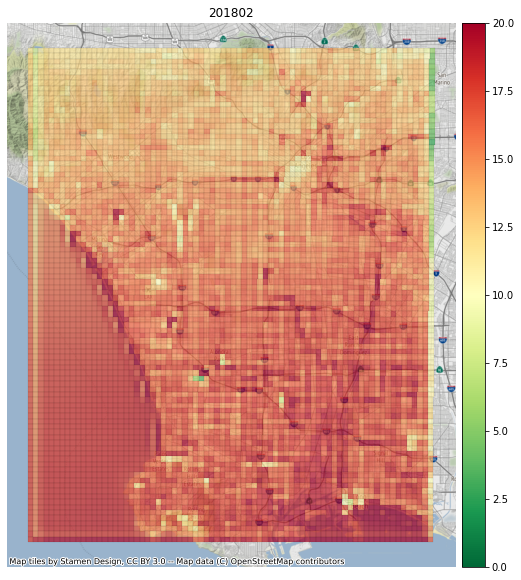

In [50]:
kwargs['v_min'] = 0
kwargs['v_max'] = 20
t = 10

mean_prediction = np.mean(prediction9, axis=0)
out_weight(m9, data_obj9, param, **kwargs)
sp_viz(mean_prediction, data_obj9, param, **kwargs)
# tp_viz(prediction4, data_obj4, param, **kwargs)
# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)
# write_csv(prediction9, data_obj9, param, **kwargs)


In [126]:
base_dir = f'data/los_angeles_500m_acc_1234_tp1_2'
kwargs['model_dir'] = os.path.join(base_dir, 'models/')
kwargs['result_dir'] = os.path.join(base_dir, 'results/')
kwargs['model_name'] = f'dapm___sp_ae_esc_acc___los_angeles_500m_2019___#11#___6_00001_1___1_10_5_001___16_13'
kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
param = Param([11], 2019)
m9 = torch.load(kwargs['model_file'])    
prediction9, data_obj9 = predict_main(m9, param, **kwargs)



dapm___sp_ae_esc_acc___los_angeles_500m_2019___#11#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 8.7399, MAPE = 75.8902, R2 = 0.8066.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#11#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 9.5290, MAPE = 72.4854, R2 = 0.7619.
Max: 100.9050064086914; Min: 2.2411346435546875e-05


29 [['dayofweek', 0.50178665], ['dayofyear', 0.43755153], ['dew_point', 0.09725072], ['wind_bearing', 0.025299216], ['wind_speed', 0.015914273], ['wind_direction', 0.008432922], ['roads_living_street', 0.006652596], ['roads_trunk_link', 0.0051140897], ['hourofday', 0.0031720262], ['traffic_fuel', 0.0027366423], ['roads_track_grade3', 0.0019849974], ['roads_track_grade4', 0.001744228], ['transport_railway_station', 0.0015283063], ['landuse_a_farm', 0.0013266853], ['roads_service', 0.000988268], ['water_a_river', 0.000920337], ['traffic_mini_roundabout', 0.00087945786], ['cloud_cover', 0.0008631613], ['pressure', 0.00080005336], ['railways_rail', 0.0007718913], ['landuse_a_scrub', 0.00076314376], ['landuse_a_meadow', 0.00067766017], ['traffic_parking_multistorey', 0.00047716824], ['traffic_crossing', 0.00029142338], ['railways_light_rail', 0.00025209135], ['humidity', 0.00023124235], ['landuse_a_retail', 0.00016816374], ['roads_primary', 0.00016697642], ['landuse_a_allotments', 0.0001260

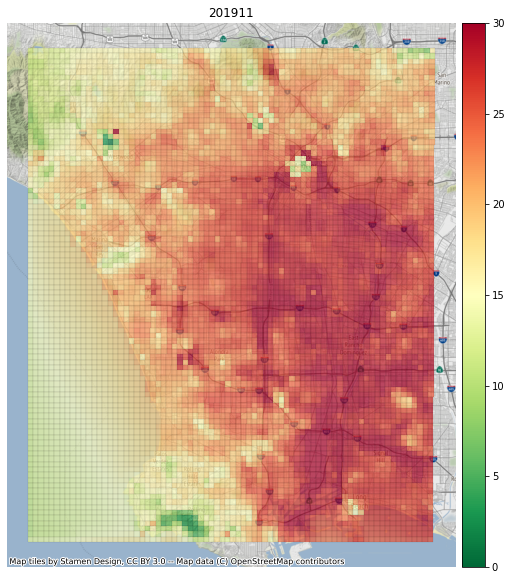

Testing locations: 4165


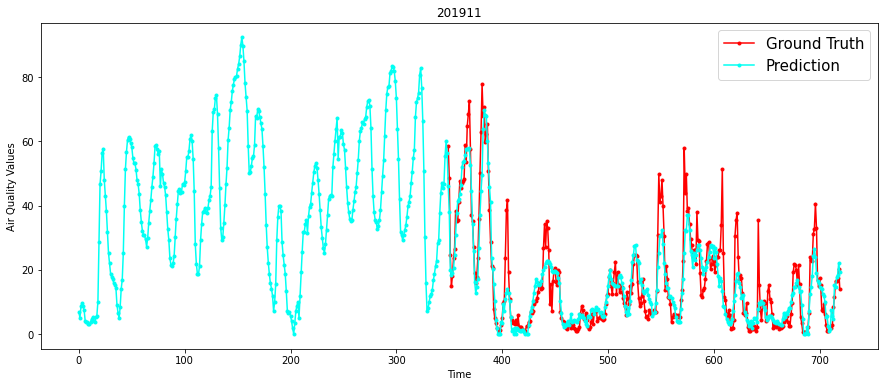

Testing locations: 6696


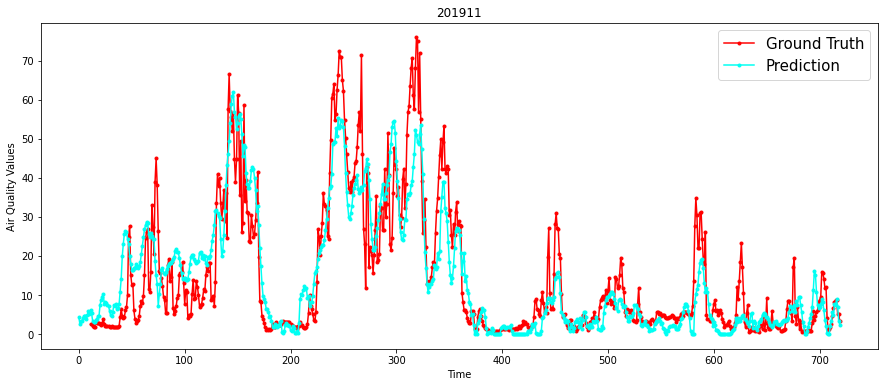

Testing locations: 5963


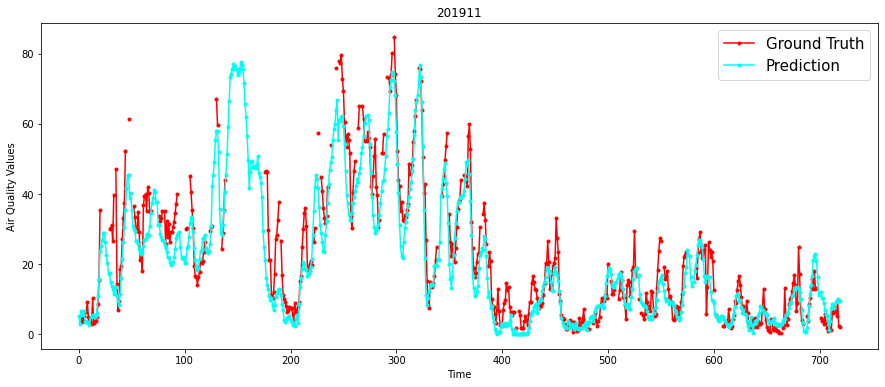

Testing locations: 1048


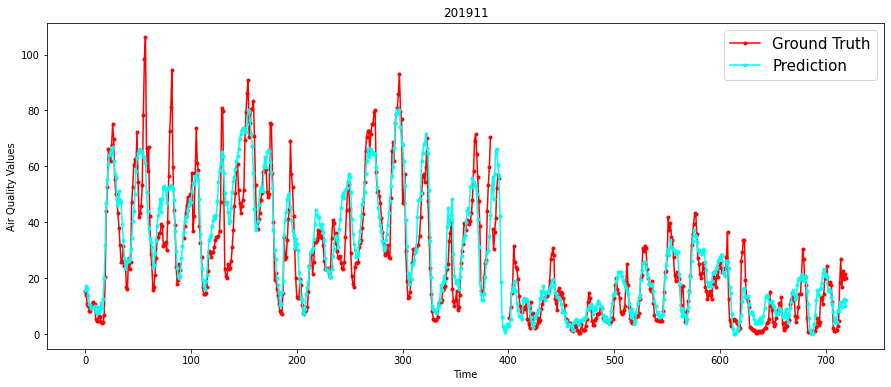

Testing locations: 5115


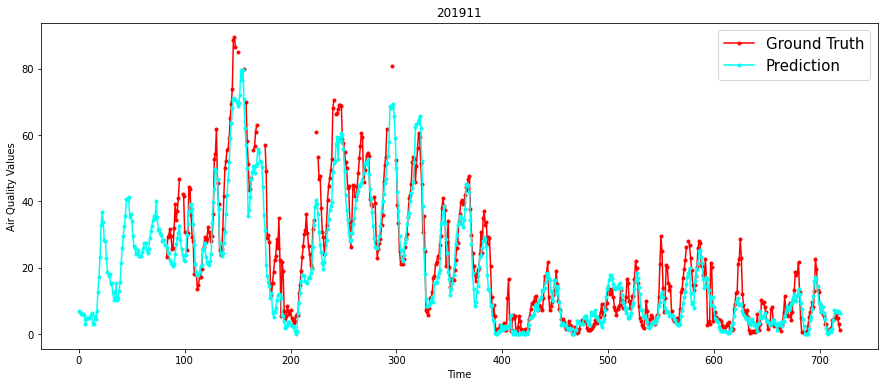

In [128]:
kwargs['v_min'] = 0
kwargs['v_max'] = 30
t = 10

mean_prediction = np.mean(prediction9, axis=0)
out_weight(m9, data_obj9, param, **kwargs)
sp_viz(mean_prediction, data_obj9, param, **kwargs)
tp_viz(prediction9, data_obj9, param, **kwargs)
# multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)
# write_csv(prediction9, data_obj9, param, **kwargs)


dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 8.0843, MAPE = 179.1022, R2 = 0.7038.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 6.9327, MAPE = 111.6855, R2 = 0.7748.
Max: 105.34081268310547; Min: 4.76837158203125e-06
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#01#___6_00001_1___1_10_5_001___16_13
22 [['dayofyear', 0.43311164], ['dayofweek', 0.39976144], ['dew_point', 0.19876377], ['wind_speed', 0.10540054], ['visibility', 0.0914598], ['temperature', 0.039953478], ['landuse_a_military', 0.013508746], ['cloud_cover', 0.005405103], ['wind_bearing', 0.0053198272], ['humidity', 0.0023671666], ['roads_steps', 0.0019758078], ['lat', 0.0018473602], ['roads_service', 0.0015821488], ['roads_pedestrian', 0.0013210251], ['landuse_a_retail', 0.0011981783], ['roads_tertiary', 0.0011902407], ['roads_living_street', 0.0010452133], ['roads_tertiary_link', 0.00097058027], ['pressure', 0.0009290756]

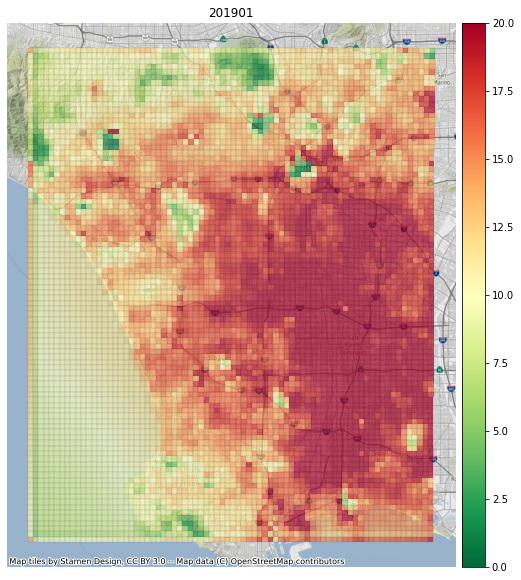

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#02#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 5.7560, MAPE = 114.4464, R2 = 0.7034.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#02#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 5.7404, MAPE = 173.4341, R2 = 0.6450.
Max: 60.34169006347656; Min: 5.4836273193359375e-06
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#02#___6_00001_1___1_10_5_001___16_13
32 [['dayofyear', 0.4229282], ['dayofweek', 0.40691096], ['dew_point', 0.18523836], ['visibility', 0.08854128], ['wind_speed', 0.077112526], ['temperature', 0.03887757], ['cloud_cover', 0.014336698], ['wind_bearing', 0.011927938], ['landuse_a_retail', 0.009662952], ['roads_living_street', 0.0074045546], ['landuse_a_meadow', 0.004831629], ['humidity', 0.003408383], ['traffic_street_lamp', 0.003298761], ['landuse_a_residential', 0.0030825904], ['roads_motorway', 0.002411191], ['hourofday', 0.0016448969], ['roads_tertiary', 0.0014250574], ['roads_pedestrian', 0.001294882], ['lon', 0.0012367

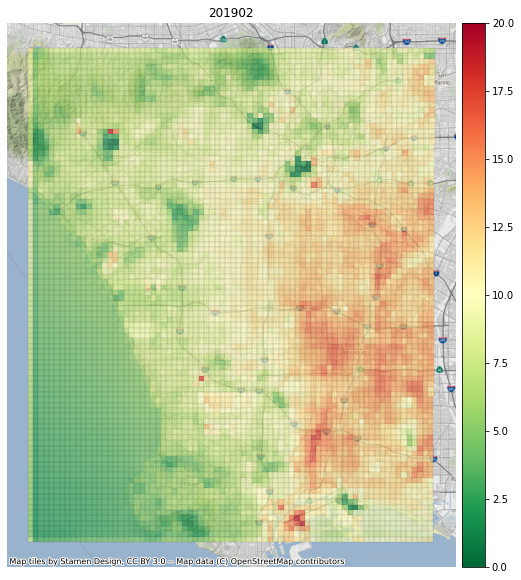

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#03#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 5.1830, MAPE = 141.1071, R2 = 0.6244.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#03#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 4.8380, MAPE = 76.5918, R2 = 0.7111.
Max: 50.08622360229492; Min: 5.9604644775390625e-06
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#03#___6_00001_1___1_10_5_001___16_13
22 [['dayofyear', 0.42464316], ['dayofweek', 0.39668167], ['dew_point', 0.19737242], ['wind_speed', 0.08029141], ['temperature', 0.037833538], ['visibility', 0.03099447], ['roads_motorway', 0.0015266074], ['traffic_mini_roundabout', 0.0010681603], ['wind_bearing', 0.00106612], ['landuse_a_military', 0.0008752668], ['landuse_a_nature_reserve', 0.00050827814], ['transport_bus_station', 0.0004721205], ['roads_track_grade3', 0.00046480336], ['cloud_cover', 0.00042582944], ['roads_service', 0.00041983268], ['waterways_stream', 0.0002899139], ['roads_trunk', 0.00028357722], ['landuse_a_grass', 

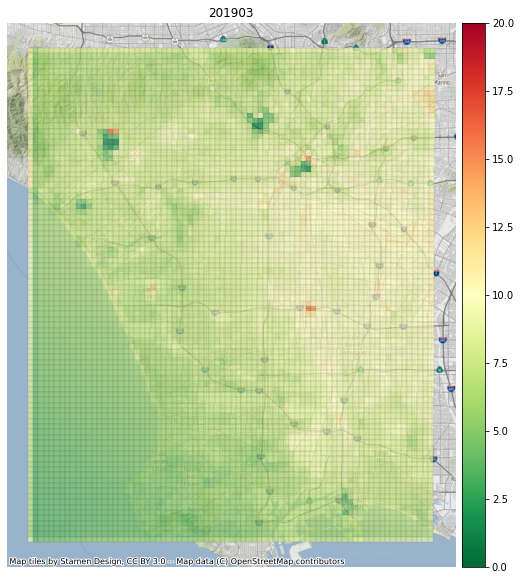

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#04#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 3.9209, MAPE = 43.8088, R2 = 0.8679.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#04#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 4.0730, MAPE = 59.0143, R2 = 0.8492.
Max: 52.89297866821289; Min: 9.5367431640625e-06
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#04#___6_00001_1___1_10_5_001___16_13
13 [['dayofweek', 0.40686443], ['dayofyear', 0.39499754], ['dew_point', 0.24830629], ['cloud_cover', 0.054212607], ['visibility', 0.013630417], ['wind_speed', 0.010899945], ['wind_direction', 0.006916269], ['roads_living_street', 0.003724505], ['temperature', 0.0024234452], ['hourofday', 0.0012775959], ['lat', 0.0010675088], ['landuse_a_allotments', 0.00068900717], ['water_a_river', 0.0005749066]]


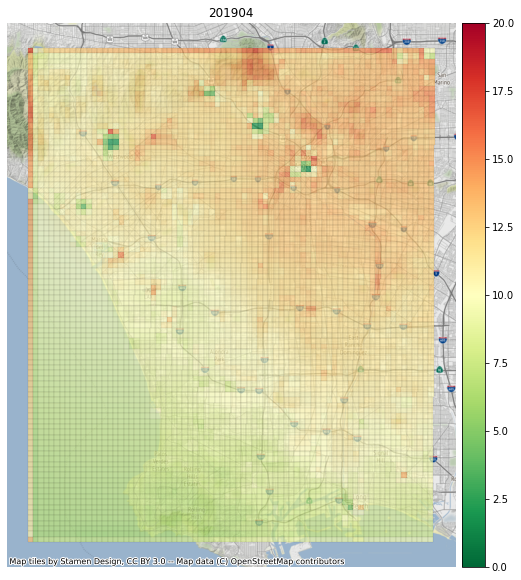

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#05#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 4.2143, MAPE = 52.8383, R2 = 0.8073.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#05#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 4.2807, MAPE = 50.7866, R2 = 0.8269.
Max: 50.875938415527344; Min: 0.0009069442749023438
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#05#___6_00001_1___1_10_5_001___16_13
26 [['dayofweek', 0.42181548], ['dayofyear', 0.34806222], ['dew_point', 0.22567269], ['cloud_cover', 0.018663885], ['wind_bearing', 0.007641], ['pressure', 0.005901985], ['roads_living_street', 0.005538212], ['landuse_a_retail', 0.0035679194], ['humidity', 0.0025831151], ['traffic_crossing', 0.0016490793], ['landuse_a_scrub', 0.001436018], ['traffic_stop', 0.0014196108], ['landuse_a_allotments', 0.0012512805], ['landuse_a_recreation_ground', 0.0008491878], ['roads_tertiary', 0.0008148671], ['lat', 0.00072372897], ['visibility', 0.00040568435], ['traffic_dam', 0.00038307905], ['traffic_stre

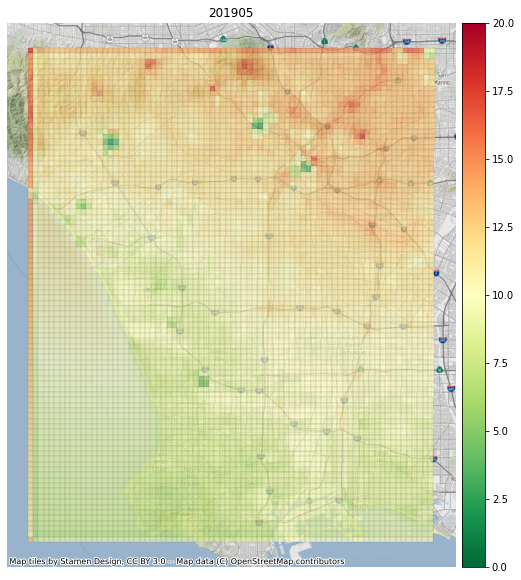

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#06#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 4.5908, MAPE = 31.1760, R2 = 0.7575.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#06#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 4.5097, MAPE = 30.1963, R2 = 0.7727.
Max: 59.34422302246094; Min: 0.0009708404541015625
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#06#___6_00001_1___1_10_5_001___16_13
17 [['dayofweek', 0.41045952], ['dayofyear', 0.35759604], ['dew_point', 0.15576498], ['cloud_cover', 0.04849513], ['pressure', 0.020234946], ['visibility', 0.013702314], ['wind_direction', 0.006609358], ['wind_bearing_lr', 0.00615003], ['roads_track_grade4', 0.0030745417], ['lat', 0.0023065752], ['humidity', 0.002126828], ['roads_steps', 0.0020932565], ['landuse_a_retail', 0.0020289503], ['roads_trunk_link', 0.00046115828], ['roads_track_grade2', 0.00025843532], ['roads_motorway', 0.00021979284], ['roads_footway', 0.00010211791]]


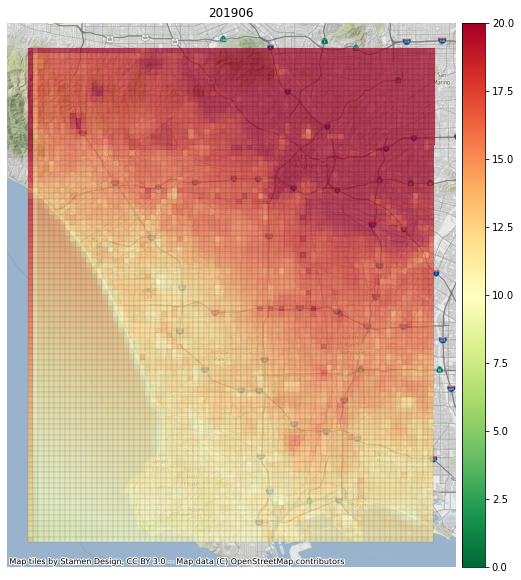

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#07#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 7.0484, MAPE = 21.9455, R2 = 0.5676.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#07#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 6.5348, MAPE = 33.0747, R2 = 0.5835.
Max: 68.27493286132812; Min: 3.525853157043457
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#07#___6_00001_1___1_10_5_001___16_13
40 [['dayofweek', 0.45069924], ['dayofyear', 0.35715148], ['dew_point', 0.13509336], ['cloud_cover', 0.052401252], ['pressure', 0.03286963], ['visibility', 0.02032201], ['wind_speed', 0.0119072795], ['roads_steps', 0.008145069], ['wind_bearing', 0.007880585], ['landuse_a_residential', 0.0060454546], ['wind_direction', 0.0032984691], ['traffic_stop', 0.0029234968], ['traffic_turning_circle', 0.0022365113], ['temperature', 0.0015694161], ['hourofday', 0.0014815212], ['traffic_dam', 0.0014477391], ['wind_bearing_lr', 0.0013975222], ['waterways_stream', 0.0012677171], ['roads_living_street', 0.0011

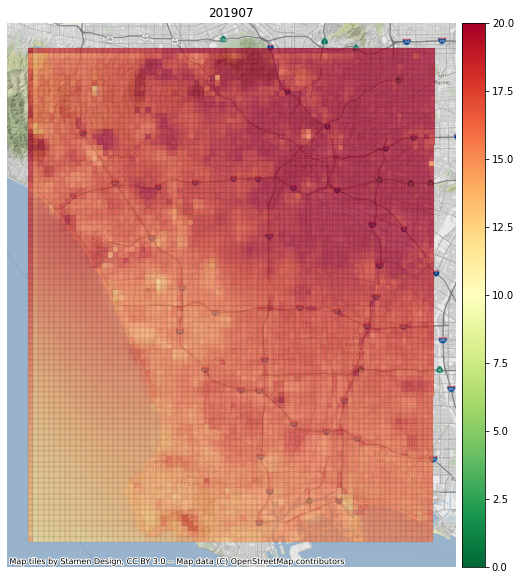

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#08#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 4.3303, MAPE = 57.7330, R2 = 0.7709.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#08#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 6.6546, MAPE = 21.7414, R2 = 0.5827.
Max: 61.27924728393555; Min: 6.723403930664062e-05
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#08#___6_00001_1___1_10_5_001___16_13
13 [['dayofweek', 0.4522959], ['dayofyear', 0.36054423], ['dew_point', 0.1178899], ['visibility', 0.015114717], ['wind_speed', 0.0061986973], ['cloud_cover', 0.0031547723], ['roads_track_grade4', 0.0014248939], ['pressure', 0.0010842279], ['roads_residential', 0.0009768537], ['traffic_slipway', 0.00094979437], ['wind_direction', 0.00087497896], ['roads_track_grade3', 0.00032083897], ['waterways_river', 0.00020720721]]


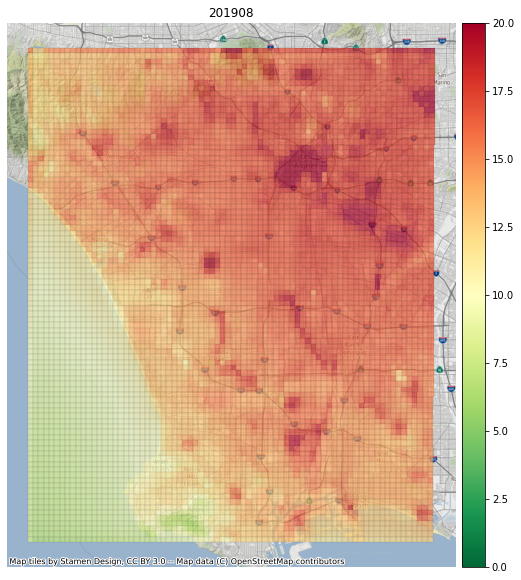

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#09#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 3.9244, MAPE = 28.6719, R2 = 0.7171.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#09#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 4.1287, MAPE = 26.1785, R2 = 0.7114.
Max: 44.88991928100586; Min: 0.0003457069396972656
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#09#___6_00001_1___1_10_5_001___16_13
19 [['dayofweek', 0.4511111], ['dayofyear', 0.3883356], ['dew_point', 0.13404843], ['temperature', 0.041150942], ['cloud_cover', 0.027984736], ['visibility', 0.0068813073], ['wind_speed', 0.002636956], ['pressure', 0.0024441895], ['traffic_dam', 0.0012153059], ['lat', 0.0006556392], ['waterways_canal', 0.00037410905], ['waterways_stream', 0.0002855309], ['transport_taxi', 0.0001976545], ['traffic_turning_circle', 0.00019202256], ['waterways_river', 0.00018455705], ['landuse_a_allotments', 0.00016064073], ['traffic_slipway', 0.00015543896], ['landuse_a_nature_reserve', 0.00012937942], ['road

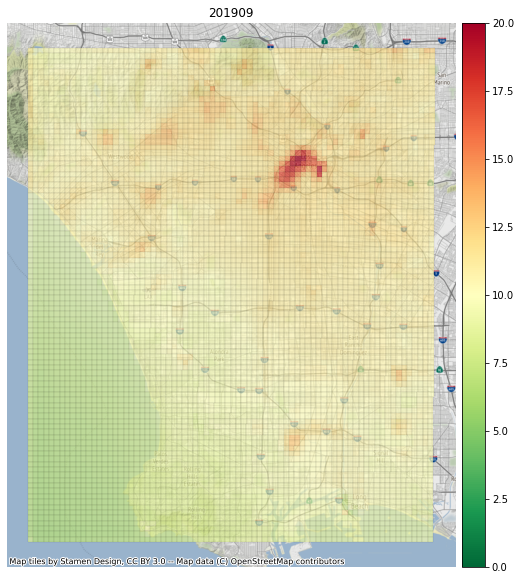

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#10#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 7.5850, MAPE = 93.8246, R2 = 0.4687.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#10#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 8.0815, MAPE = 79.1280, R2 = 0.4743.
Max: 46.57775115966797; Min: 0.0001583099365234375
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#10#___6_00001_1___1_10_5_001___16_13
41 [['dayofweek', 0.45024997], ['dayofyear', 0.37627664], ['dew_point', 0.12323124], ['temperature', 0.021859566], ['wind_bearing', 0.018803958], ['wind_speed', 0.009728263], ['cloud_cover', 0.009559463], ['visibility', 0.008905294], ['landuse_a_nature_reserve', 0.0063475175], ['humidity', 0.0055901795], ['pressure', 0.0041945153], ['roads_residential', 0.0029254844], ['wind_bearing_lr', 0.0027283845], ['wind_direction', 0.0023065195], ['waterways_drain', 0.002303613], ['landuse_a_allotments', 0.0020509337], ['lat', 0.0014976057], ['roads_steps', 0.0013667367], ['roads_trunk_link', 0.001220

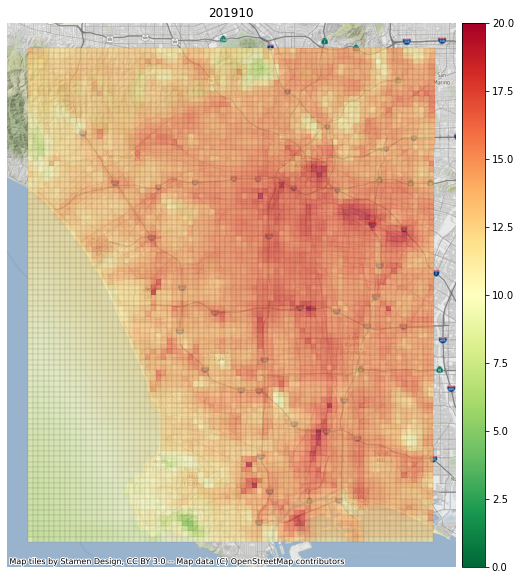

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#11#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 8.7399, MAPE = 75.8902, R2 = 0.8066.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#11#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 9.5290, MAPE = 72.4854, R2 = 0.7619.
Max: 100.9050064086914; Min: 2.2411346435546875e-05
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#11#___6_00001_1___1_10_5_001___16_13
29 [['dayofweek', 0.50178665], ['dayofyear', 0.43755153], ['dew_point', 0.09725072], ['wind_bearing', 0.025299216], ['wind_speed', 0.015914273], ['wind_direction', 0.008432922], ['roads_living_street', 0.006652596], ['roads_trunk_link', 0.0051140897], ['hourofday', 0.0031720262], ['traffic_fuel', 0.0027366423], ['roads_track_grade3', 0.0019849974], ['roads_track_grade4', 0.001744228], ['transport_railway_station', 0.0015283063], ['landuse_a_farm', 0.0013266853], ['roads_service', 0.000988268], ['water_a_river', 0.000920337], ['traffic_mini_roundabout', 0.00087945786], ['cloud_cover', 0.000

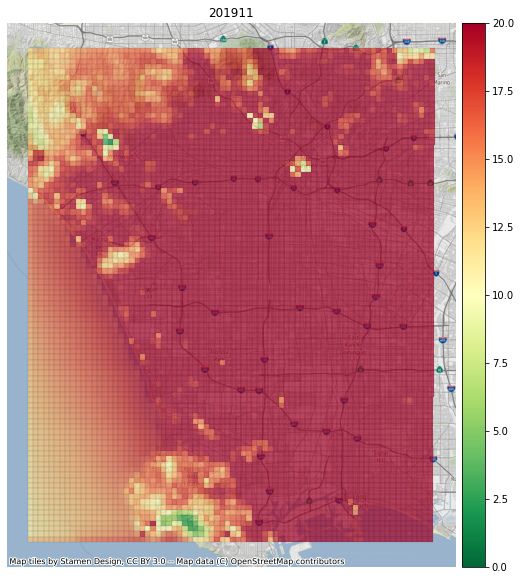

dapm___sp_ae_esc_acc___los_angeles_500m_2019___#12#___6_00001_1___1_10_5_001___16_13 VAL RMSE = 9.3294, MAPE = 212.6271, R2 = 0.6582.
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#12#___6_00001_1___1_10_5_001___16_13 TEST RMSE = 9.8709, MAPE = 289.1358, R2 = 0.5506.
Max: 91.81974792480469; Min: 1.049041748046875e-05
dapm___sp_ae_esc_acc___los_angeles_500m_2019___#12#___6_00001_1___1_10_5_001___16_13
44 [['dayofweek', 0.5207705], ['dayofyear', 0.44794258], ['dew_point', 0.08876663], ['pressure', 0.03208163], ['cloud_cover', 0.028760515], ['wind_bearing', 0.025879554], ['waterways_drain', 0.009858187], ['wind_direction', 0.008015004], ['temperature', 0.0068877204], ['railways_light_rail', 0.005767408], ['roads_footway', 0.005481926], ['roads_tertiary_link', 0.005252904], ['roads_motorway', 0.003923936], ['roads_secondary', 0.0037081654], ['visibility', 0.0035123976], ['traffic_slipway', 0.0033135682], ['lat', 0.0032331082], ['water_a_reservoir', 0.0026066815], ['hourofday', 0.002467606

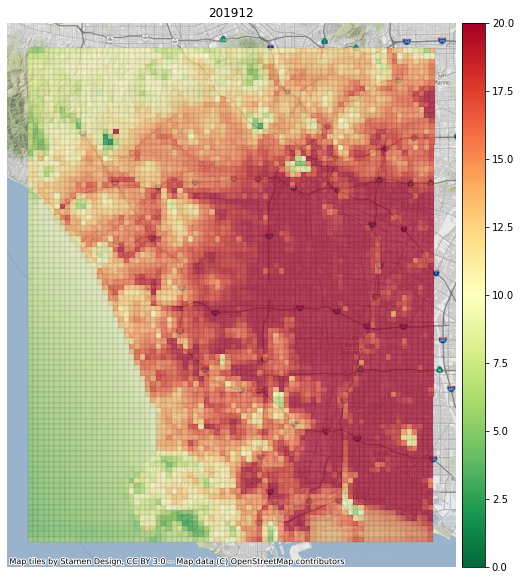

In [113]:
for i, m in enumerate([str(d).rjust(2, '0') for d in range(1, 13)]):

    try:
        base_dir = f'data/los_angeles_500m_acc_1234_tp1_2'
        kwargs['model_dir'] = os.path.join(base_dir, 'models/')
        kwargs['result_dir'] = os.path.join(base_dir, 'results/')
        kwargs['model_name'] = f'dapm___sp_ae_esc_acc___los_angeles_500m_2019___#{m}#___6_00001_1___1_10_5_001___16_13'
        kwargs['model_file'] = os.path.join(kwargs['model_dir'], kwargs['model_name'] + '.pkl')
        param = Param([i + 1], 2019)
        m = torch.load(kwargs['model_file'])    
        prediction, data_obj = predict_main(m, param, **kwargs)

        kwargs['v_min'] = 0
        kwargs['v_max'] = 20
        print(kwargs['model_name'])
    
        mean_prediction = np.mean(prediction, axis=0)
        out_weight(m, data_obj, param, **kwargs)
        sp_viz(mean_prediction, data_obj, param, **kwargs)
        # tp_viz(prediction4, data_obj4, param, **kwargs)
        # multi_sp_viz([prediction2[t, ...], data_obj2.train_y[t + 6, ...]], data_obj2, param, r=1, c=2, **kwargs)
        # write_csv(prediction9, data_obj9, param, **kwargs)
    except:
        continue